In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
import matplotlib.pyplot as plt

In [4]:
from argparse import Namespace
from pathlib import Path

import numpy as np

import torch
from torch.utils.data import Dataset, DataLoader

import pytorch_lightning as pl
from pytorch_lightning.trainer import Trainer, seed_everything
from pytorch_lightning.callbacks import EarlyStopping, ModelCheckpoint

from turboflow.datasets.turb2D import Turb2D
from turboflow.evaluation import compute_all_metrics

from turboflow.utils import phy_utils as phy
from turboflow.utils import dsp_utils as dsp
from turboflow.utils import torch_utils as tch
from turboflow.utils import viz_utils as viz 
from turboflow.utils import file_utils as fle

import cmocean

In [5]:
seed_everything(42, workers=True)

Global seed set to 42


42

(256, 256, 2)
(256, 256, 2)


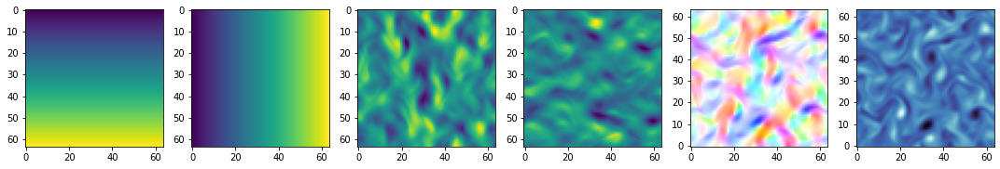

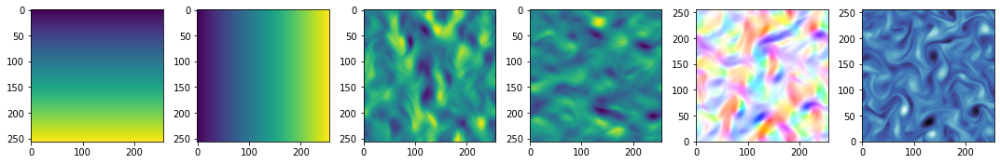

In [6]:
# load dataset
data_dir = Path('/','home','dicarlo_d','Documents','Datasets','Turb2D.hdf5')
tb = Turb2D(data_dir)

time_idx = 862
tb.load_data(time_idx)

# Data in Turb2D are (T,R,R,D)
t = tb.t
xy = tb.xy
uv = tb.uv

print(xy.shape)
print(uv.shape)

# normalize y
uv = uv/np.max(np.abs(uv))
assert np.min(uv) >= -1
assert np.max(uv) <=  1

ds = 4

xy_sq_lr = xy[::ds,::ds,:]
uv_sq_lr = uv[::ds,::ds,:]
xy_sq_hr = xy
uv_sq_hr = uv

data = {
    'ongrid' : {
        'lr' : {'xy' : xy[::ds,::ds,:], 'uv' : uv[::ds,::ds,:], 'R'  : xy[::ds,::ds,:].shape[0]},
        'hr' : {'xy' : xy, 'uv' : uv, 'R'  : xy.shape[0]},
    }
}

for res in ['lr', 'hr']:
    x = data['ongrid'][res]['xy'][...,0]
    y = data['ongrid'][res]['xy'][...,1]
    u = data['ongrid'][res]['uv'][...,0]
    v = data['ongrid'][res]['uv'][...,1]
    
    plt.figure(figsize=(15,5))
    plt.subplot(161)
    plt.imshow(x)
    plt.subplot(162)
    plt.imshow(y)
    plt.subplot(163)
    plt.imshow(u)
    plt.subplot(164)
    plt.imshow(v)
    
    plt.subplot(165)
    img = viz.flow_to_image(data['ongrid'][res]['uv'])
    plt.imshow(img, origin='lower')
    
    plt.subplot(166)
    w = phy.compute_vorticity((x, y), (u, v))
    plt.imshow(w, origin='lower', cmap=cmocean.cm.ice)
    
    plt.tight_layout()
    plt.show()

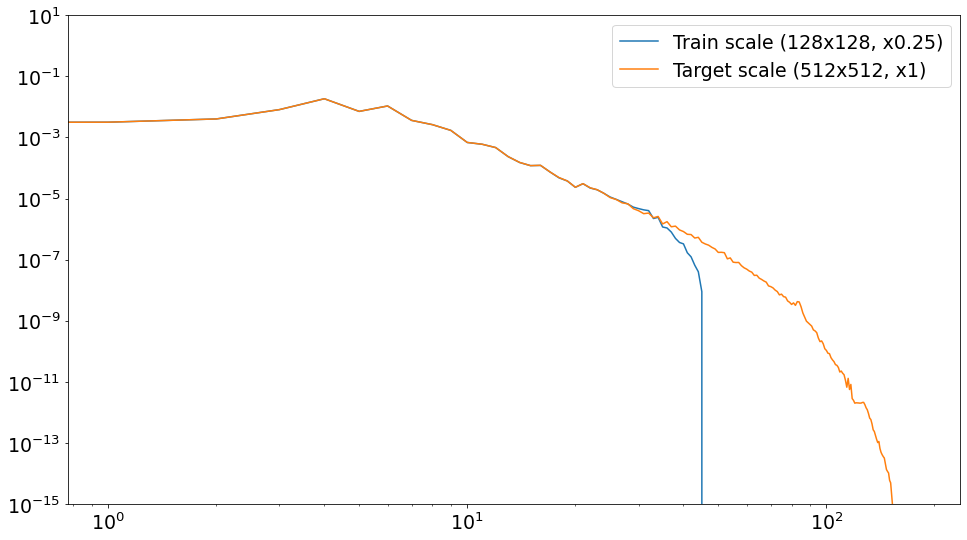

In [7]:
Ek_lr, k_lr = phy.energy_spectrum(torch.from_numpy(data['ongrid']['lr']['uv'].transpose(2,0,1)))
Ek_hr, k_hr = phy.energy_spectrum(torch.from_numpy(data['ongrid']['hr']['uv'].transpose(2,0,1)))

plt.figure(figsize=(16,9))
plt.rcParams.update({'font.size': 19})
plt.loglog(k_lr ,Ek_lr, label='Train scale (128x128, x0.25)')
plt.loglog(k_hr ,Ek_hr, label='Target scale (512x512, x1)')
plt.ylim([1e-15, 1e1])
plt.legend()
plt.show()

In [8]:
# increase resolutions
s=2
u_smp, xy_smp = dsp.interpolate2D_mesh01x01(xy, uv[:,:,0], scale=s)
v_smp, xy_smp = dsp.interpolate2D_mesh01x01(xy, uv[:,:,1], scale=s)

print(u_smp.shape)

xy_smp = np.stack([xy_smp[:,:,1], xy_smp[:,:,0]], axis=-1)
uv_smp = np.stack([u_smp, v_smp], axis=-1)


R_smp = uv_smp.shape[0]
xy_smp = xy_smp.reshape(R_smp**2, 2)
uv_smp = uv_smp.reshape(R_smp**2, 2)

uv_smp = uv_smp/np.max(np.abs(uv_smp))
print(np.max(np.abs(xy_smp)))
print(np.max(np.abs(uv_smp)))

print(uv_smp.shape)
print(xy_smp.shape)

(512, 512)
1.0
1.0
(262144, 2)
(262144, 2)


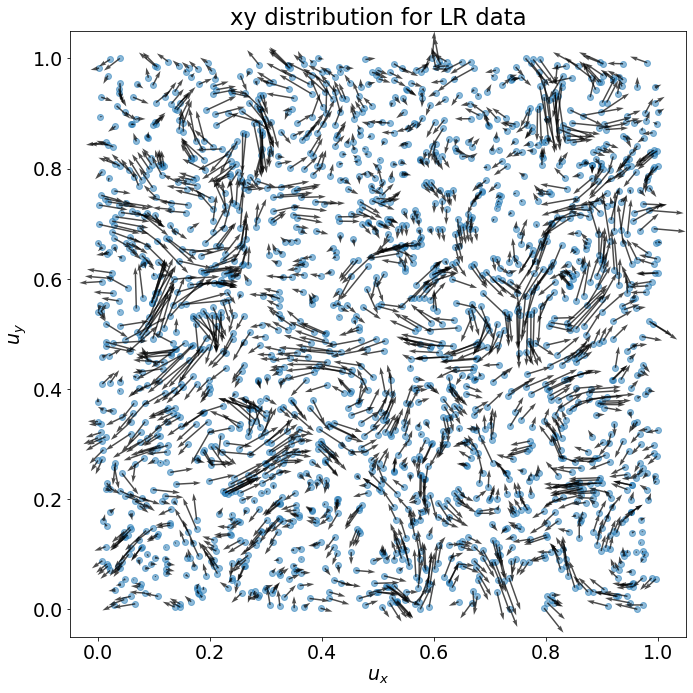

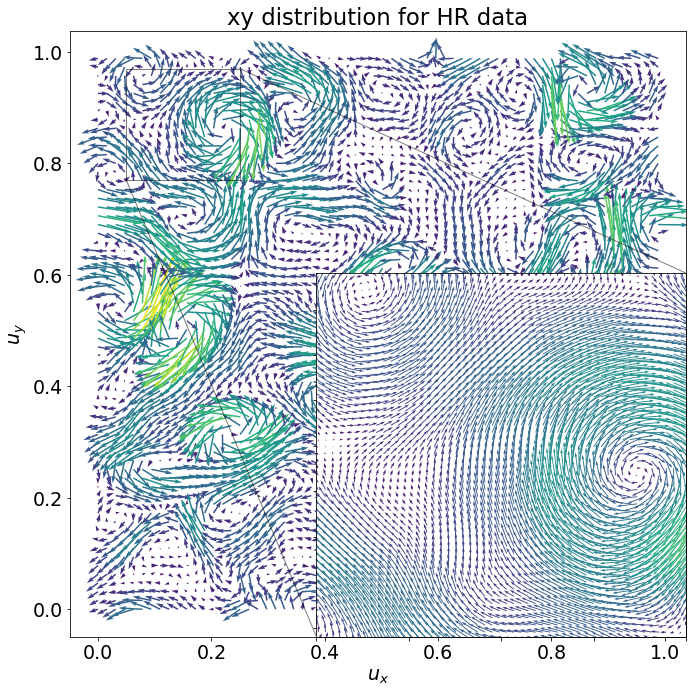

In [9]:
max_res = 256

# subsample for TEST
ppp_test = 0.07
N_test = int((max_res**2) * ppp_test)
idx_test = np.random.randint(0, R_smp**2, size=N_test)

ppp_train = 0.03
N_train = int((max_res**2)*ppp_train)
idx_train = np.random.randint(0, R_smp**2, size=N_train)

data['offgrid'] = {
    'lr' : {'xy' :  xy_smp[idx_train,:], 'uv' : uv_smp[idx_train,:], 'R' : idx_train.shape[0]},
    'hr' : {'xy' :  xy_smp[idx_test,:],  'uv' : uv_smp[idx_test,:],  'R' : idx_test.shape[0]}
}



x = data['offgrid']['lr']['xy'][...,0]
y = data['offgrid']['lr']['xy'][...,1]
u = data['offgrid']['lr']['uv'][...,0]
v = data['offgrid']['lr']['uv'][...,1]


figsize=(10,10)
plt.figure(figsize=figsize)
plt.rcParams.update({'font.size': 19})
plt.title(f'xy distribution for LR data')
plt.scatter(x, y, alpha=0.5)
ds = 1
plt.quiver(x[::ds], y[::ds], u[::ds], v[::ds], scale=10, alpha=0.7)
plt.xlabel(r'$u_x$')
plt.ylabel(r'$u_y$')
plt.tight_layout()
plt.savefig('../recipes/lxlaser_2022/figures/lr_sparse.pdf', dpi=300)
plt.show()

region=(0.05, 0.25, 0.77, 0.97)

H = data['ongrid']['hr']['R']
Xhr = data['ongrid']['hr']['xy'].reshape(H*H,2)
Uhr = data['ongrid']['hr']['uv'].reshape(H*H,2)

viz.plot_velocity_field(Xhr, Uhr, H, Xhr, Uhr, H,
                        title=None,
                        figsize=figsize,
                        region = region,
                        scale_lr=10, step_lr=4,
                        scale_hr=6, step_hr=1)
plt.title(f'xy distribution for HR data')
plt.xlabel(r'$u_x$')
plt.ylabel(r'$u_y$')
plt.tight_layout()
plt.savefig('../recipes/lxlaser_2022/figures/target_hr.pdf', dpi=300)
plt.show()

In [10]:
exp_dir = Path('../recipes/lxlaser_2022/models')
exp_paths = sorted(list(exp_dir.glob("*.pkl")))

for p, path in enumerate(exp_paths):
    print(p, path)

0 ../recipes/lxlaser_2022/models/Turb2D_version_2_nrff-0_df-False_sdiv_0_sfun_0.pkl
1 ../recipes/lxlaser_2022/models/Turb2D_version_3_nrff-256_df-False_sdiv_0_sfun_0.pkl
2 ../recipes/lxlaser_2022/models/Turb2D_version_4_nrff-256_df-False_sdiv_0.001_sfun_0.pkl
3 ../recipes/lxlaser_2022/models/Turb2D_version_6_nrff-256_df-False_sdiv_0.001_sfun_0.1.pkl
4 ../recipes/lxlaser_2022/models/Turb2D_version_7_nrff-256_df-True_sdiv_0_sfun_0.pkl
5 ../recipes/lxlaser_2022/models/Turb2D_version_8_nrff-256_df-True_sdiv_0_sfun_0.1.pkl


In [11]:
curr_exp_path = exp_paths[4]
print(curr_exp_path)

results_dict = fle.load_obj(curr_exp_path)
for k in results_dict.keys():
    print(k, results_dict[k])
model_path = results_dict['path']

from turboflow.models.phyrff_hard import plDivFreeRFFNet
model = plDivFreeRFFNet.load_from_checkpoint(model_path)
model_name = curr_exp_path.with_suffix('').name
print(model_name)

from parse import parse
res = parse('{version}_nrff-{nrff}_df-{df}_sdiv_{sdiv}_sfun_{sfun}', model_name)
print(int(res['nrff']))
print(str(res['df']))
print(float(res['sdiv']))
print(float(res['sfun']))

../recipes/lxlaser_2022/models/Turb2D_version_7_nrff-256_df-True_sdiv_0_sfun_0.pkl
metrics [{'test/metrics/reconstruction': 0.0916646420955658, 'test/metrics/angular_degree': 12.609395027160645}]
path /home/dicarlo_d/Documents/Code/TurboSuperResultion/recipes/lxlaser_2022/.torch_checkpoints_lxlaser/Turb2D-RFFNet-epoch=419-val_loss=0.0000.ckpt
hparams {'name': 'RFFNet', 'mlp_layers_num': 5, 'mlp_layers_dim': 256, 'mlp_last_actfn': 'tanh', 'do_rff': True, 'rff_num': 256, 'rff_scale': 10, 'do_divfree': True, 'lam_sdiv': 0, 'lam_sfn': 0, 'lam_spec': 0, 'lam_grads': 0, 'lam_curl': 0, 'lam_pde': 0, 'lam_weight': 1e-05, 'sfn_min_x': 0.00390625, 'sfn_num_centers': 32, 'sfn_num_increments': 4, 'sfn_patch_dim': 16}
pl_version version_7
Turb2D_version_7_nrff-256_df-True_sdiv_0_sfun_0
256
True
0.0
0.0


In [12]:
# # linear inrerpolation
# from scipy import interpolate
# uv_lr = data['offgrid']['lr']['uv']
# xy_lr = data['offgrid']['lr']['xy']
# R = data['ongrid']['hr']['R']
# xy_hr = data['ongrid']['hr']['xy'].reshape(R*R,2)
# XYgt = data['ongrid']['hr']['xy'].reshape(R*R,2)
# UVgt = data['ongrid']['hr']['uv'].reshape(R*R,2)


# f_inter = interpolate.Rbf(xy_lr[:,0], xy_lr[:,1], uv_lr[:,0])
# u_ = f_inter(xy_hr[:,0], xy_hr[:,1])

# f_inter = interpolate.Rbf(xy_lr[:,0], xy_lr[:,1], uv_lr[:,1])
# v_ = f_inter(xy_hr[:,0], xy_hr[:,1])

# XY_ = xy_hr
# UV_ = np.stack([u_, v_], axis=-1)
# print(uv_.shape)


# viz.plot_velocity_field(XY_, UV_, R, XY_, UV_, R,
#                         title='Reconstructed field (1 vpp)',
#                         figsize= figsize,
#                         region = region,
#                         scale_lr=10, step_lr=4,
#                         scale_hr=6, step_hr=1)
# plt.tight_layout()
# plt.show()


# viz.plot_velocity_field(XY_, UV_ - UVgt, R, XY_, UV_ - UVgt, R,
#                         title='Error at 1 vpp',
#                         figsize= figsize,
#                         region = region,
#                         scale_lr=10, step_lr=4,
#                         scale_hr=6, step_hr=1)
# plt.savefig(f'../recipes/lxlaser_2022/figures/{model_name}_r_quiver.pdf', dpi=300)

# plt.tight_layout()
# plt.show()

img_nrff-0_df-False_sdiv_0_sfun_0


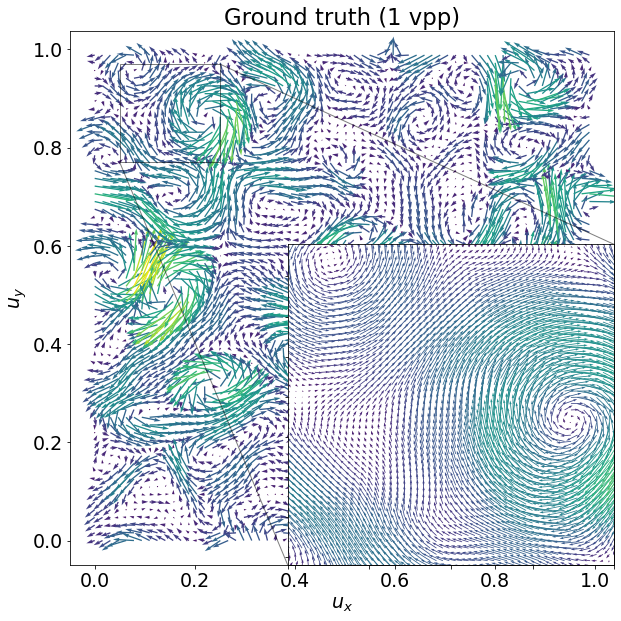

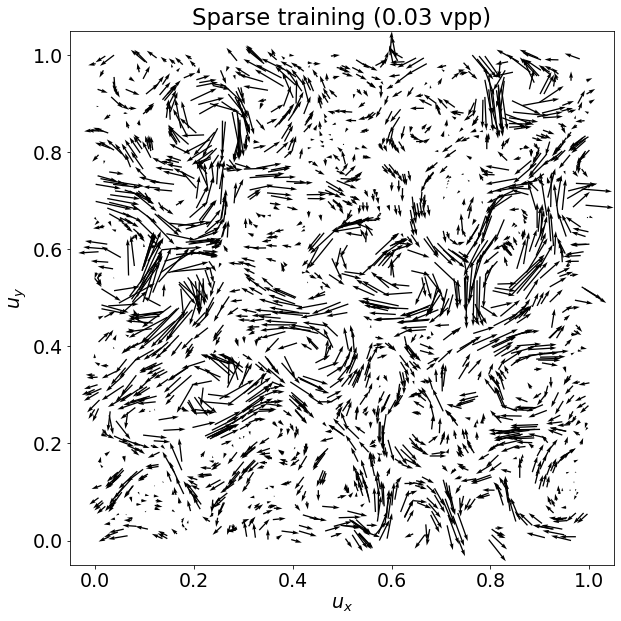

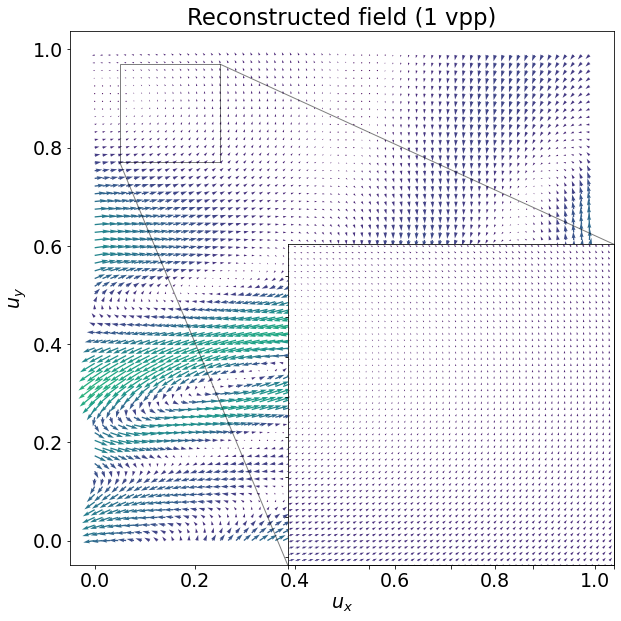

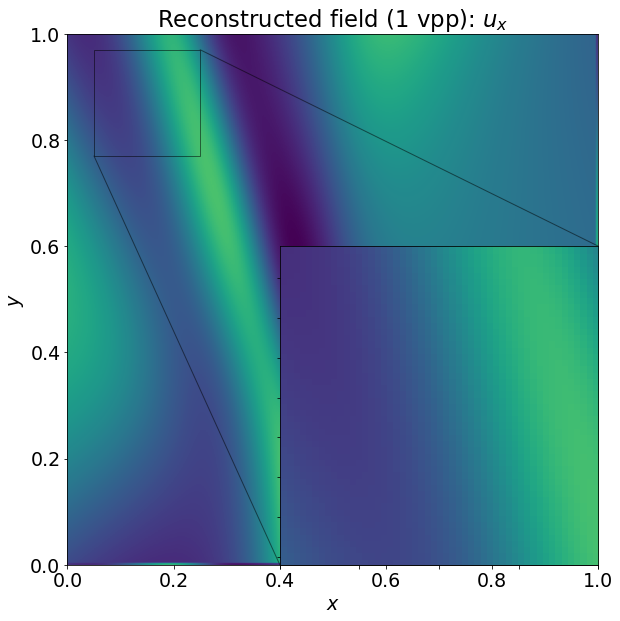

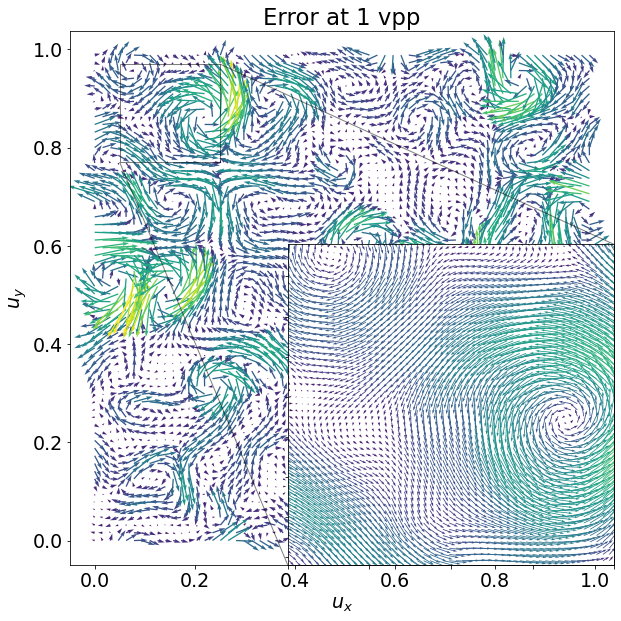

img_nrff-256_df-False_sdiv_0_sfun_0


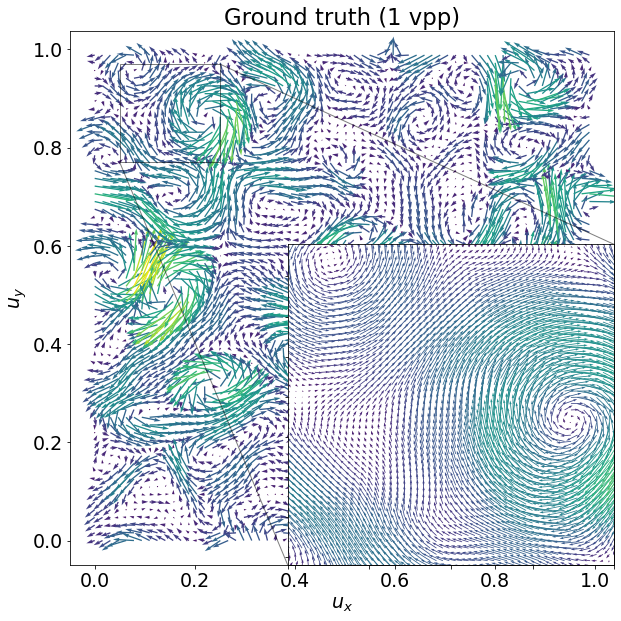

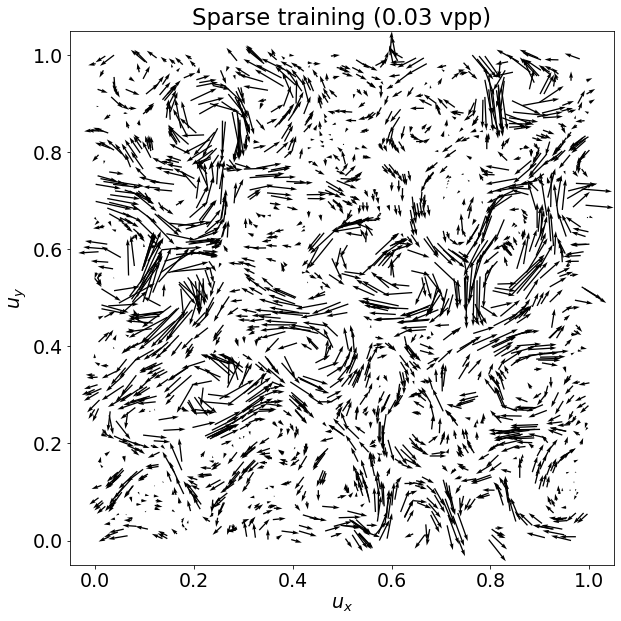

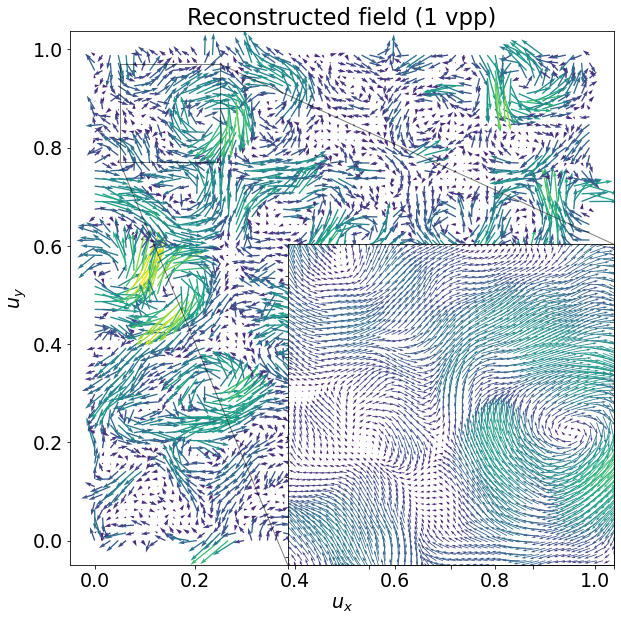

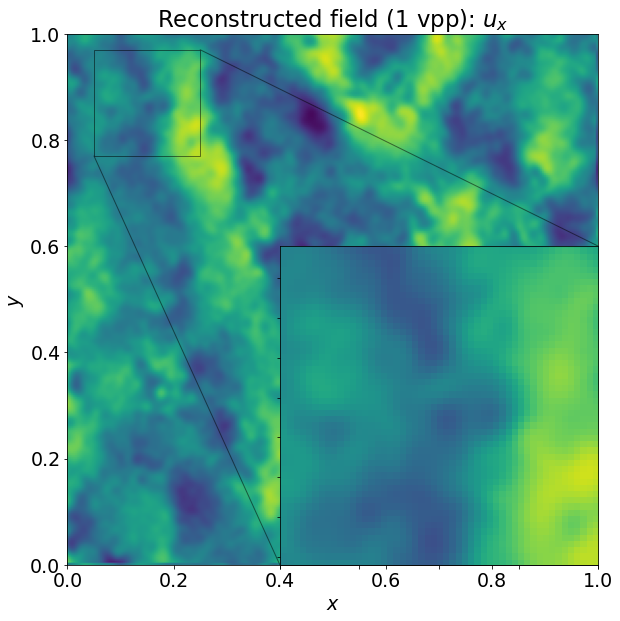

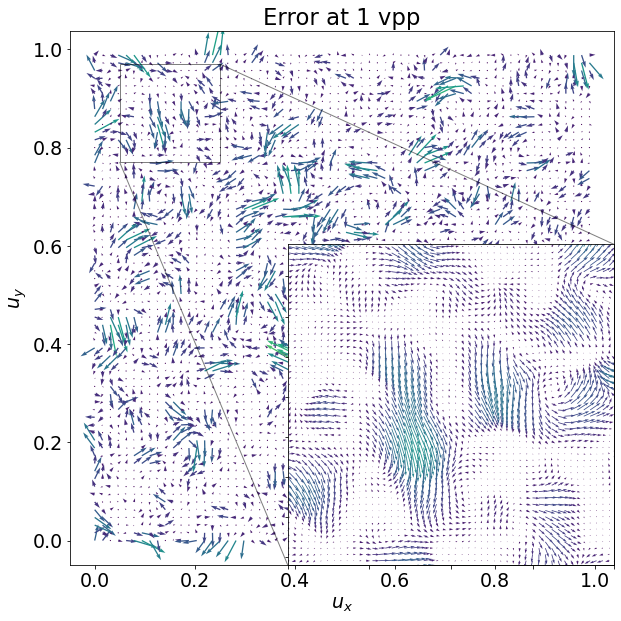

img_nrff-256_df-False_sdiv_0.001_sfun_0


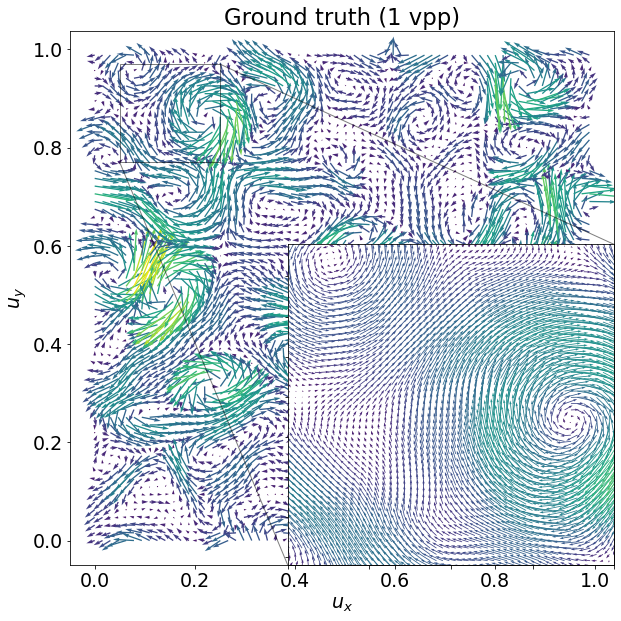

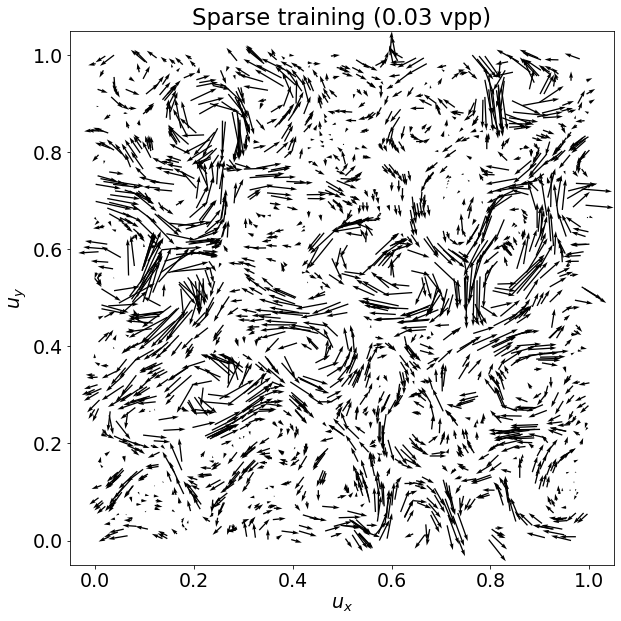

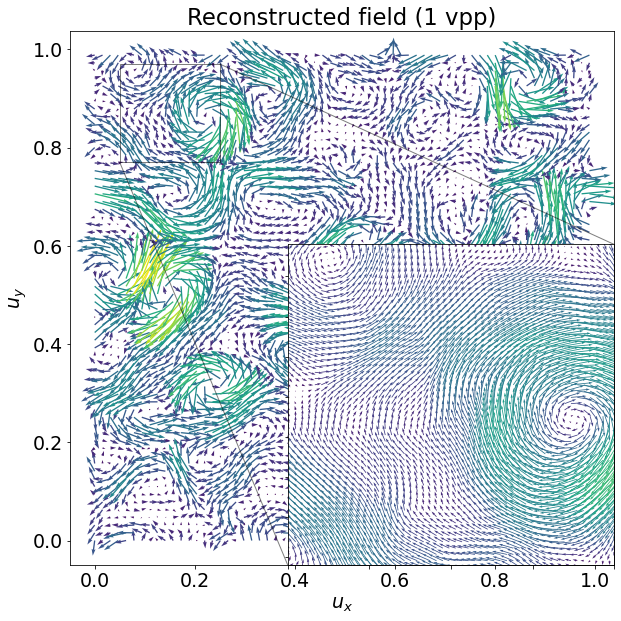

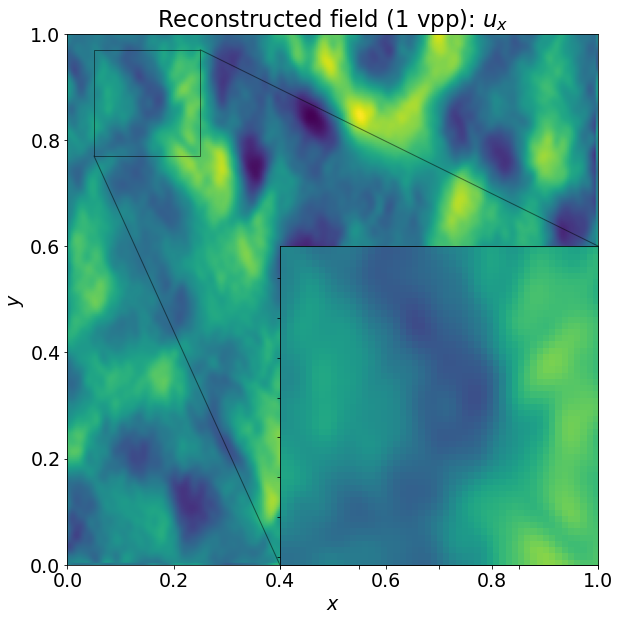

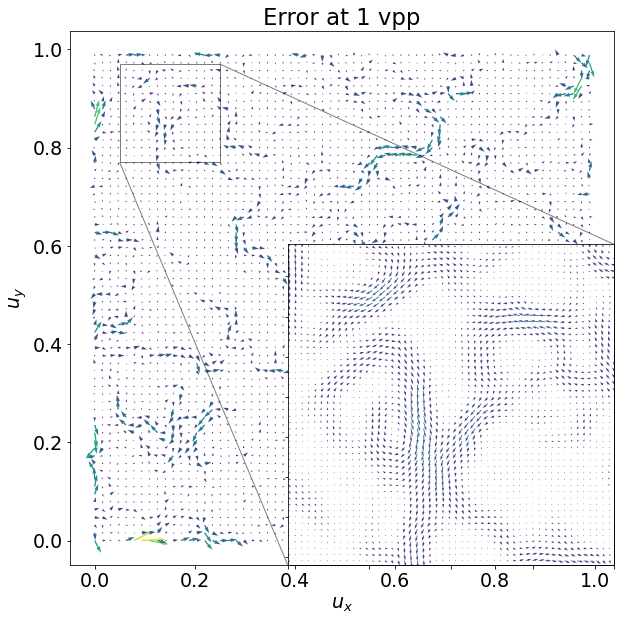

img_nrff-256_df-False_sdiv_0.001_sfun_0.1


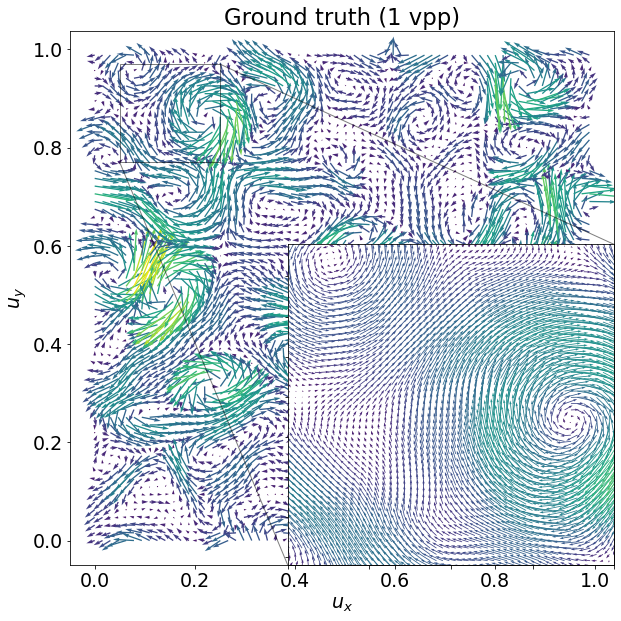

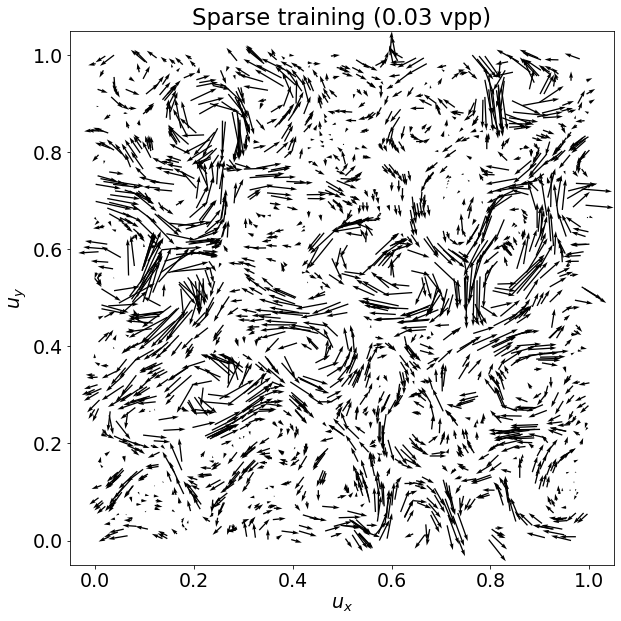

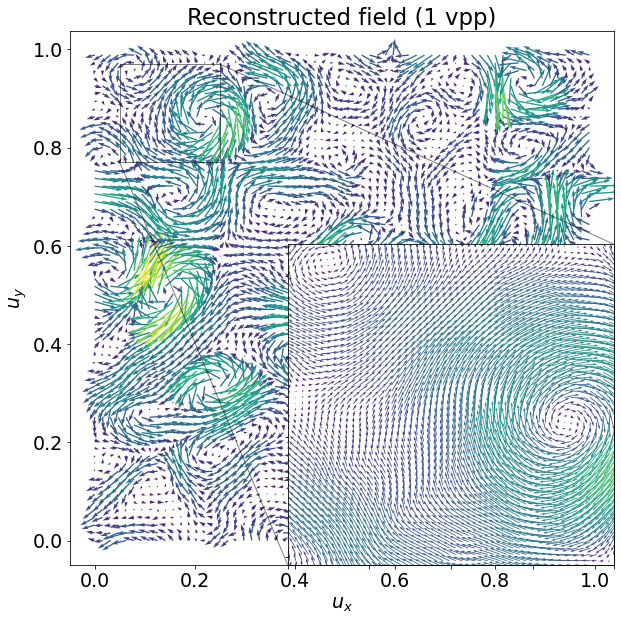

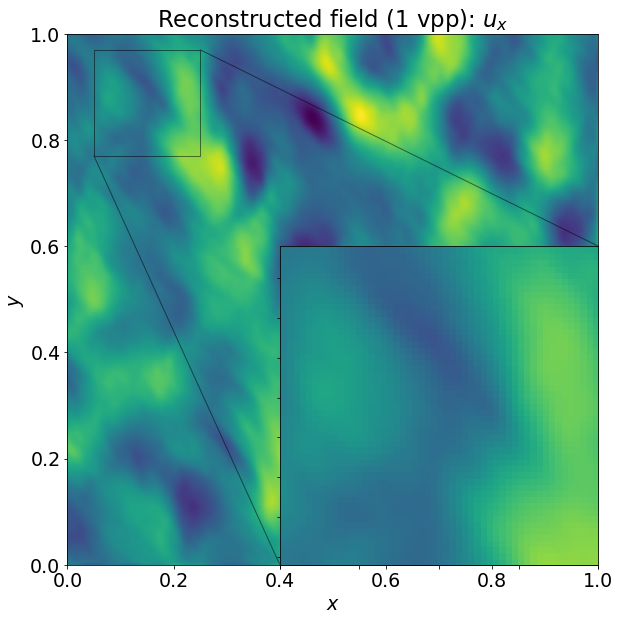

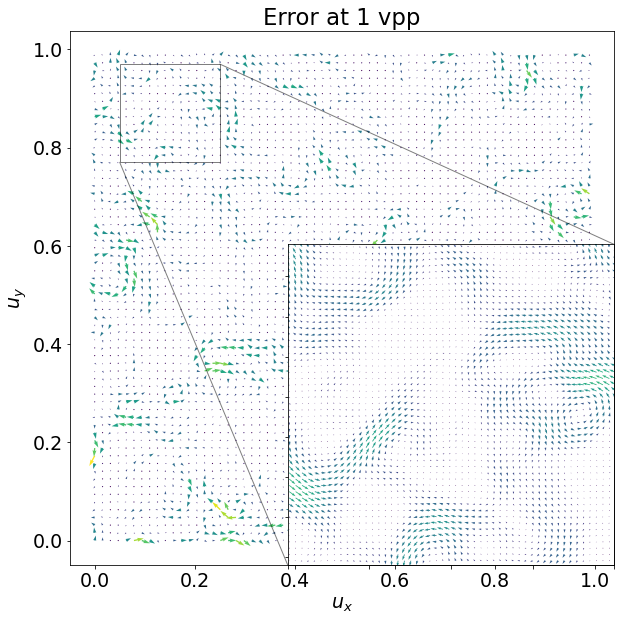

img_nrff-256_df-True_sdiv_0_sfun_0


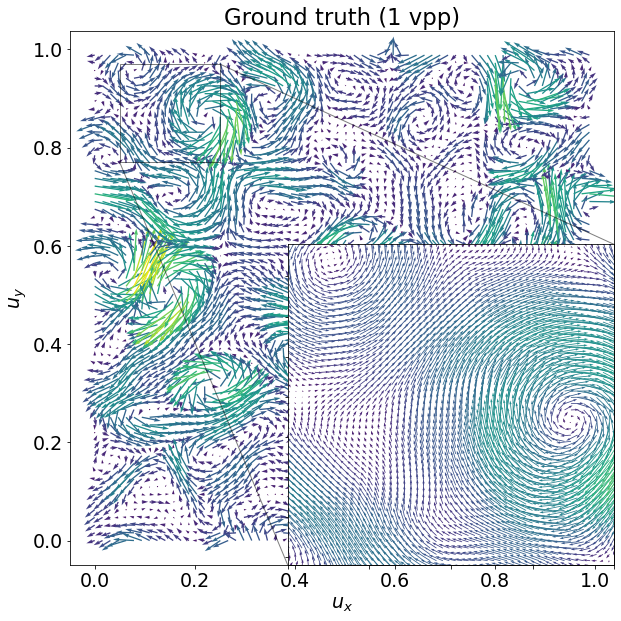

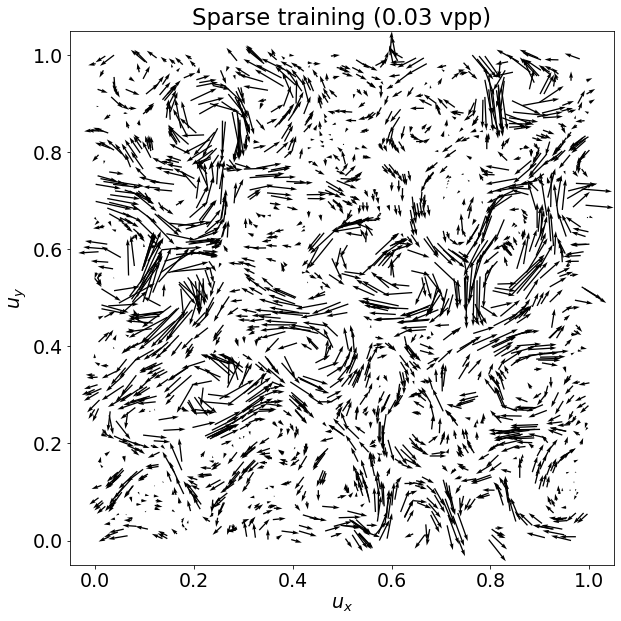

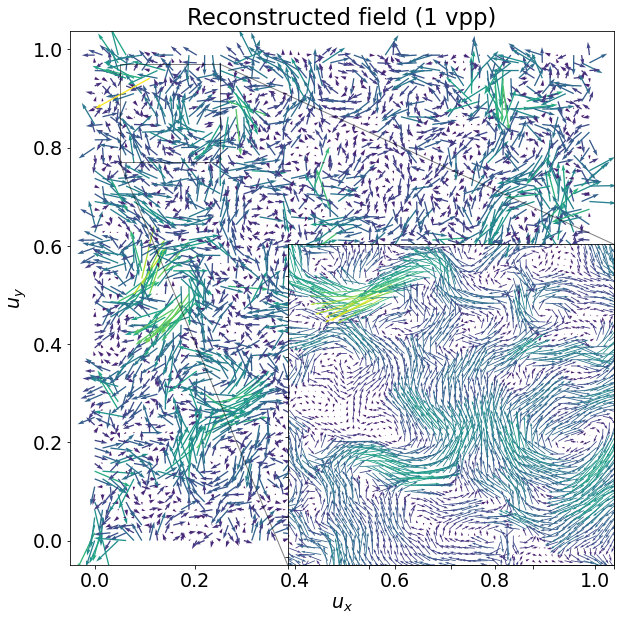

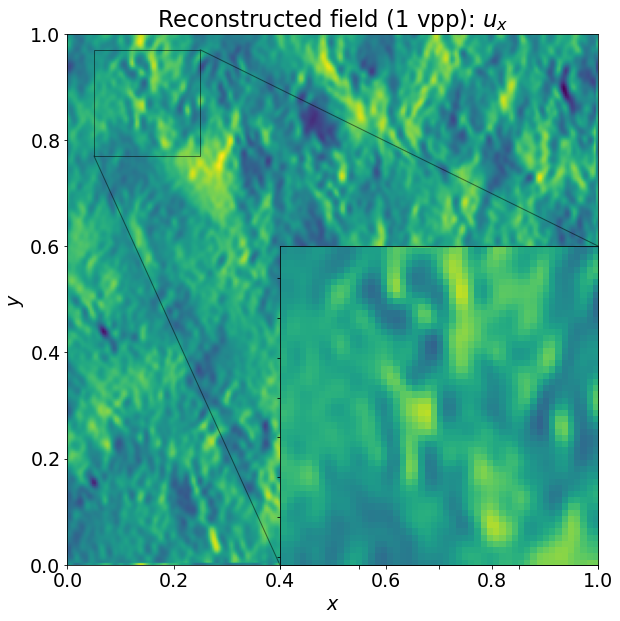

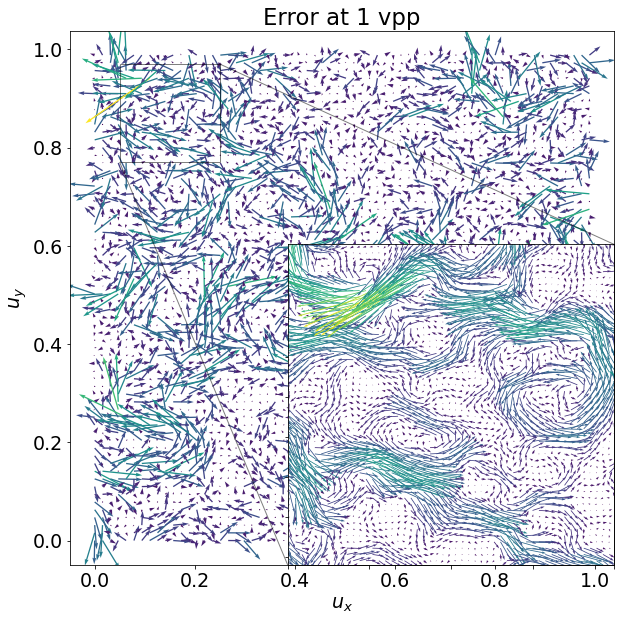

img_nrff-256_df-True_sdiv_0_sfun_0.1


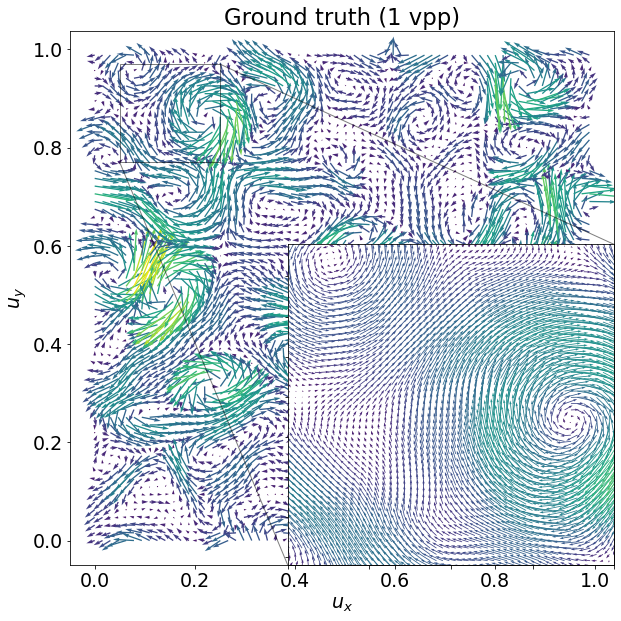

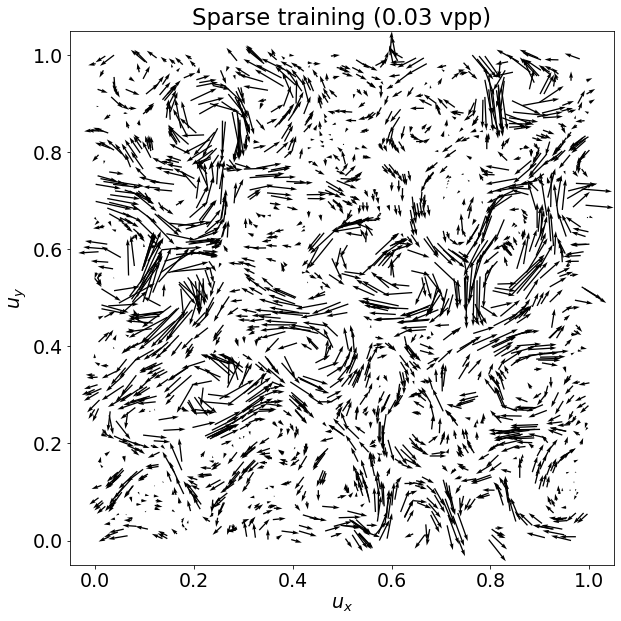

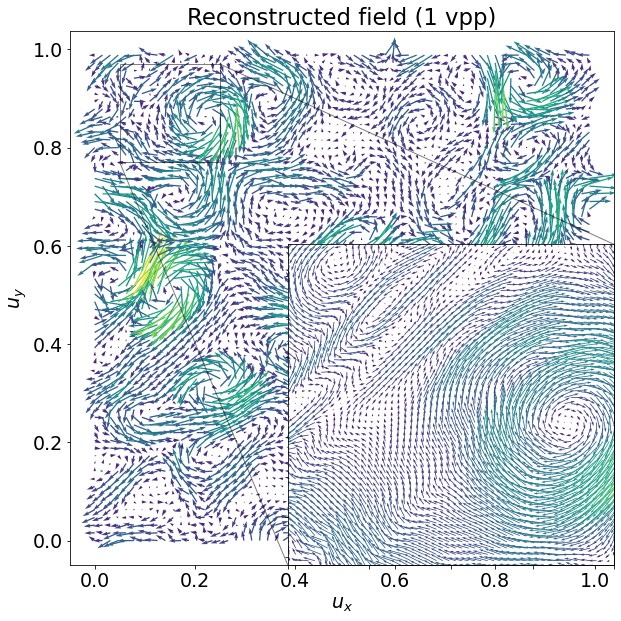

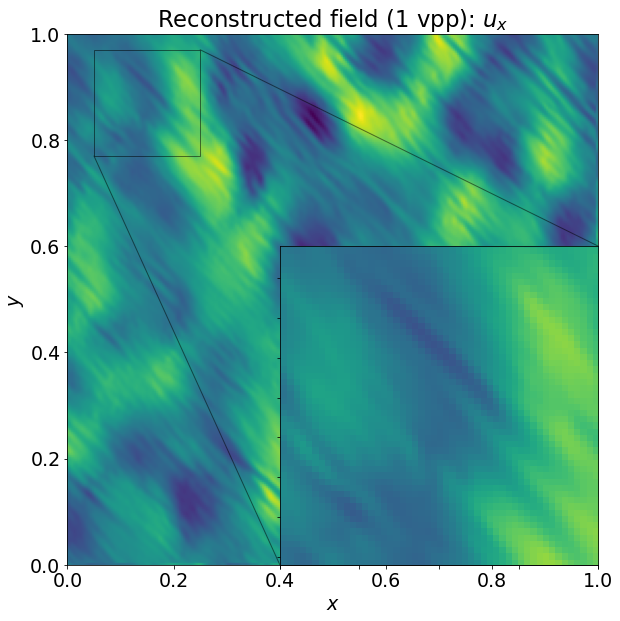

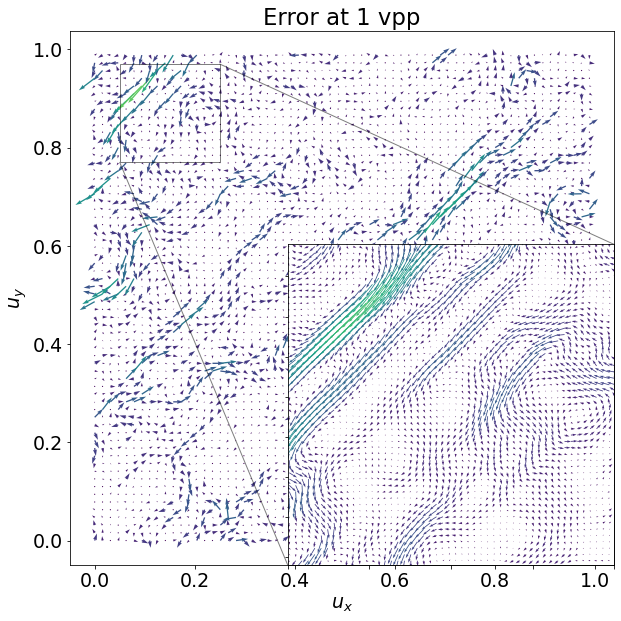

In [23]:
for path in exp_paths:
    results_dict = fle.load_obj(path)
    model_path = results_dict['path']

    from turboflow.models.phyrff_hard import plDivFreeRFFNet
    model = plDivFreeRFFNet.load_from_checkpoint(model_path)
    
    model_name = Path(path).with_suffix('').name
    res = parse('Turb2D_version_{version}_{params}', model_name)
    params = res['params']
    model_name = f'img_{params}'
    print(model_name)
        
    res = 'hr'
    R = data['ongrid'][res]['R']
    patch_ln = torch.linspace(0, 1, R)
    # make it square meshgrid
    patch_sq = torch.stack(torch.meshgrid(patch_ln, patch_ln), dim=-1)

    xy = patch_sq.view(-1,2)
    uv = model(xy)[0]

    x = xy.reshape(R,R,2).detach().cpu().numpy()[:,:,0]
    y = xy.reshape(R,R,2).detach().cpu().numpy()[:,:,1]
    u = uv.reshape(R,R,2).detach().cpu().numpy()[:,:,0]
    v = uv.reshape(R,R,2).detach().cpu().numpy()[:,:,1]

    XY_ = xy.detach().cpu().numpy()
    UV_ = uv.detach().cpu().numpy()

    figsize = (9,9)
    region=(0.05, 0.25, 0.77, 0.97)


    XYgt = data['ongrid']['hr']['xy'].reshape(R*R,2)
    UVgt = data['ongrid']['hr']['uv'].reshape(R*R,2)
    viz.plot_velocity_field(XYgt, UVgt, R, XYgt, UVgt, R,
                            title='Ground truth (1 vpp)',
                            figsize=figsize,
                            region = region,
                            scale_lr=10, step_lr=4,
                            scale_hr=6, step_hr=1)
    plt.tight_layout()
    plt.savefig(f'../recipes/lxlaser_2022/figures/{model_name}_rec_img.pdf', dpi=300)
    plt.show()

    plt.figure(figsize=figsize)
    plt.title('Sparse training (0.03 vpp)')
    plt.quiver(data['offgrid']['lr']['xy'][:, 0], 
               data['offgrid']['lr']['xy'][:, 1],
               data['offgrid']['lr']['uv'][:, 0],
               data['offgrid']['lr']['uv'][:, 1], scale=10)
    plt.xlabel(r'$u_x$')
    plt.ylabel(r'$u_y$')
    plt.tight_layout()
    plt.savefig(f'../recipes/lxlaser_2022/figures/{model_name}_tgt_quiver.pdf', dpi=300)
    plt.show()

    
    viz.plot_velocity_field(XY_, UV_, R, XY_, UV_, R,
                            title='Reconstructed field (1 vpp)',
                            figsize= figsize,
                            region = region,
                            scale_lr=10, step_lr=4,
                            scale_hr=6, step_hr=1)
    plt.savefig(f'../recipes/lxlaser_2022/figures/{model_name}_rec_quiver.pdf', dpi=300)
    plt.tight_layout()
    plt.show()


    viz.plot_lr_hr_inset(UV_, UV_, R, R,
                            title='Reconstructed field (1 vpp)',
                            figsize=figsize,
                            region = region,
                            only_u=True)
    plt.tight_layout()
    plt.savefig(f'../recipes/lxlaser_2022/figures/{model_name}_rec_img.pdf', dpi=300)
    plt.show()


    viz.plot_velocity_field(XY_, UV_ - UVgt, R, XY_, UV_ - UVgt, R,
                            title='Error at 1 vpp',
                            figsize= figsize,
                            region = region,
                            scale_lr=10, step_lr=4,
                            scale_hr=6, step_hr=1)
    plt.savefig(f'../recipes/lxlaser_2022/figures/{model_name}_err_quiver.pdf', dpi=300)

    plt.tight_layout()
    plt.show()

../recipes/lxlaser_2022/models/Turb2D_version_7_nrff-256_df-True_sdiv_0_sfun_0.pkl


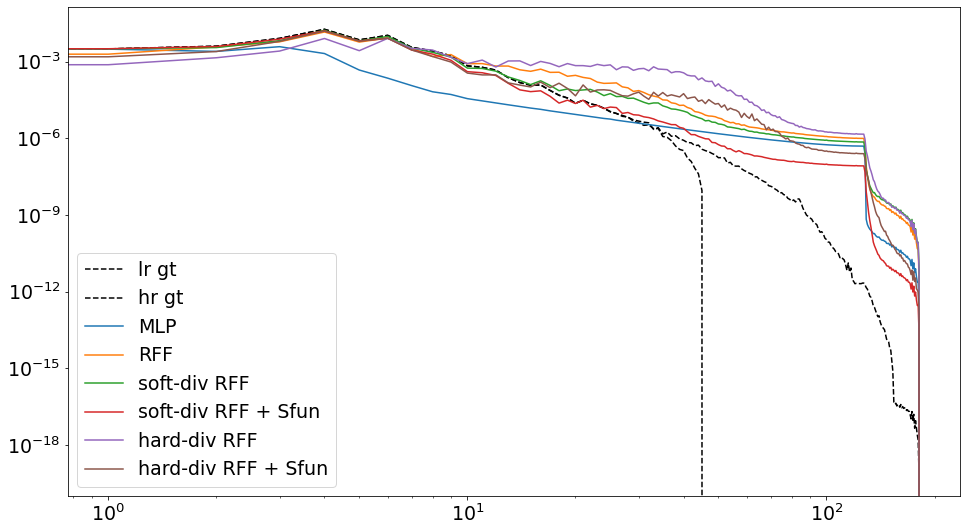

In [32]:
spec_lr = phy.energy_spectrum(torch.Tensor(data['ongrid']['lr']['uv']).permute(2,0,1))[0]
spec_hr = phy.energy_spectrum(torch.Tensor(data['ongrid']['hr']['uv']).permute(2,0,1))[0]

curr_exp_path = exp_paths[4]
print(curr_exp_path)

plt.figure(figsize=(16,9))

plt.loglog(spec_lr, 'k--', label='lr gt')
plt.loglog(spec_hr, 'k--', label='hr gt')


def spec(path):
    results_dict = fle.load_obj(path)
    model_path = results_dict['path']
    from turboflow.models.phyrff_hard import plDivFreeRFFNet
    model = plDivFreeRFFNet.load_from_checkpoint(model_path)
    
    # compute spectrum
    res = 'lr'
    R = data['ongrid'][res]['R']
    xy = torch.Tensor(data['ongrid'][res]['xy']).view(-1,2)
    uv = model(xy)[0]
    Slr, klr = phy.energy_spectrum(uv.view(R,R,2).permute(2,0,1))

    res = 'hr'
    R = data['ongrid'][res]['R']
    xy = torch.Tensor(data['ongrid'][res]['xy']).view(-1,2)
    uv = model(xy)[0]
    Shr, khr = phy.energy_spectrum(uv.view(R,R,2).permute(2,0,1))
    return Slr, klr,  Shr, khr


Slr, klr,  Shr, khr = spec(exp_paths[0])
plt.loglog(khr.detach(), Shr.detach(), label=f'MLP')

Slr, klr,  Shr, khr = spec(exp_paths[1])
plt.loglog(khr.detach(), Shr.detach(), label=f'RFF')

Slr, klr,  Shr, khr = spec(exp_paths[2])
plt.loglog(khr.detach(), Shr.detach(), label=f'soft-div RFF')

Slr, klr,  Shr, khr = spec(exp_paths[3])
plt.loglog(khr.detach(), Shr.detach(), label=f'soft-div RFF + Sfun')

Slr, klr,  Shr, khr = spec(exp_paths[4])
plt.loglog(khr.detach(), Shr.detach(), label=f'hard-div RFF')

Slr, klr,  Shr, khr = spec(exp_paths[5])
plt.loglog(khr.detach(), Shr.detach(), label=f'hard-div RFF + Sfun')

plt.legend(loc='lower left')
plt.savefig('../recipes/lxlaser_2022/figures/spec_5.pdf', dpi=300)
plt.show()